# Show SOP ImageNet

In this notebook, we describe how to load an existing sop model and show the groups.
We will break down into the following steps:

1. Load the model from a directory
2. Show the groups

In [20]:
import torch
import os
from transformers import AutoImageProcessor, AutoModelForImageClassification

import sys
sys.path.append('/shared_data0/weiqiuy/exlib/src')
from exlib.modules.sop import WrappedModel, SOPConfig, SOPImageCls, get_chained_attr


# init backbone model
backbone_model = AutoModelForImageClassification.from_pretrained('google/vit-base-patch16-224')
processor = AutoImageProcessor.from_pretrained('google/vit-base-patch16-224')

# get needed wrapped models
original_model = WrappedModel(backbone_model, output_type='logits')
wrapped_backbone_model = WrappedModel(backbone_model, output_type='tuple')
projection_layer = WrappedModel(wrapped_backbone_model, output_type='hidden_states')

# load trained sop model
model = SOPImageCls.from_pretrained('BrachioLab/sop-vit-base-patch16-224', 
                                    blackbox_model=wrapped_backbone_model, 
                                    projection_layer=projection_layer)
model.eval();

projection layer is not frozen


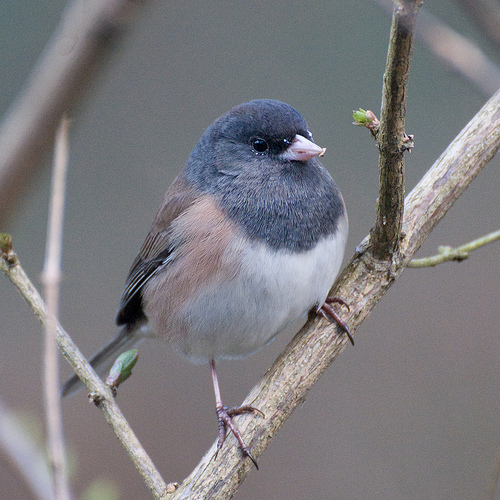

torch.Size([1, 3, 224, 224])

In [13]:
from PIL import Image

# Open an example image
# image_path = '../../examples/ILSVRC2012_val_00000873.JPEG'
image_path = '../../examples/ILSVRC2012_val_00000247.JPEG'
image = Image.open(image_path)
image.show()
image_rgb = image.convert("RGB")
inputs = torch.tensor(processor(image_rgb)['pixel_values'])
inputs.shape

In [14]:
# Get the outputs from the model
outputs = model(inputs, return_tuple=True)

In [15]:
print('logits', outputs.logits.shape)
print('logits_all', outputs.logits_all.shape)
print('masks', outputs.masks.shape)
print('group_attributions', outputs.group_attributions.shape)

logits torch.Size([1, 1000])
logits_all torch.Size([1, 20, 1000])
masks torch.Size([1, 20, 224, 224])
group_attributions torch.Size([1, 20, 1000])


In [16]:
outputs.mask_weights[0,:,0]

tensor([0.0579, 0.0551, 0.0123, 0.0536, 0.0483, 0.0541, 0.0545, 0.0519, 0.0554,
        0.0550, 0.0496, 0.0517, 0.0413, 0.0581, 0.0322, 0.0523, 0.0527, 0.0579,
        0.0540, 0.0523], grad_fn=<SelectBackward0>)

## Show the groups from SOP for this image

Here we show the groups for this image. This `show_masks_weights` function shows the groups that are actually used where `outputs.group_attributions` is nonzero, and then show all the groups.

In [17]:
outputs.logits.argmax(-1)

tensor([13])

In [18]:
pred = outputs.logits.argmax(-1)
outputs.group_attributions[0,:,pred], model.config.id2label[pred.item()]

(tensor([[0.0068],
         [0.4365],
         [4.1144],
         [0.2534],
         [0.7632],
         [0.5975],
         [0.4993],
         [0.5094],
         [0.0000],
         [0.0000],
         [0.6099],
         [0.0000],
         [0.0000],
         [0.2924],
         [3.3080],
         [0.5931],
         [0.4702],
         [0.0068],
         [0.0000],
         [0.9209]], grad_fn=<IndexBackward0>),
 'junco, snowbird')

original


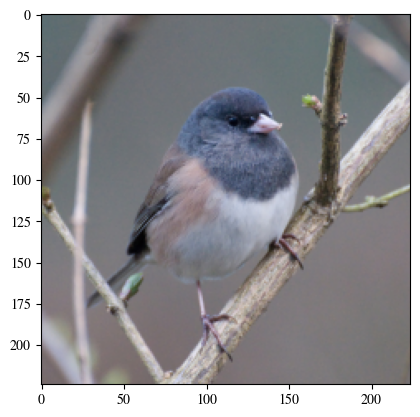

selected masks


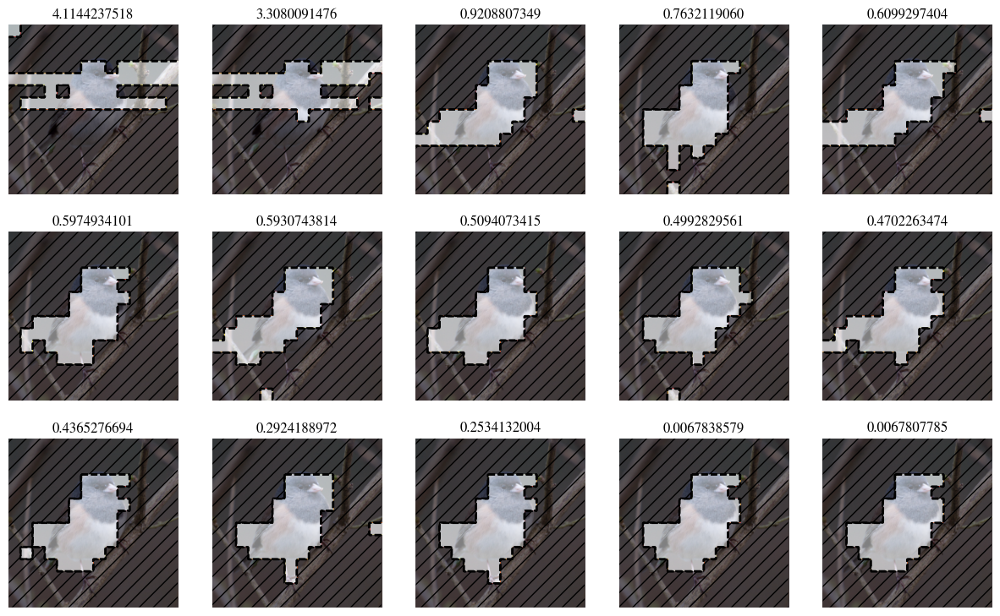

all masks


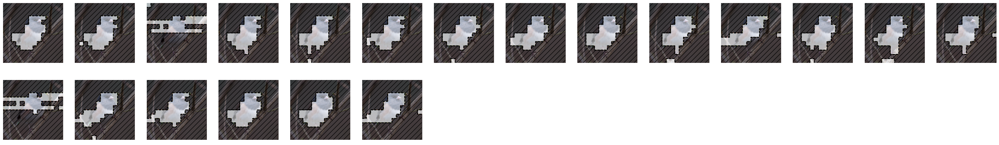

In [19]:
from exlib.modules.sop import show_masks_weights

show_masks_weights(inputs, outputs, i=0)

# Initialize an SOP model from scratch and train

We first show how to initialize an SOP model with a pretrained ViT model, and then show the groups from this untrained SOP, and then we show how to train it.

## Init SOP with a pretrained ViT model

In [1]:
import torch
import os
from transformers import AutoImageProcessor, AutoModelForImageClassification, AutoConfig

import sys
sys.path.append('/shared_data0/weiqiuy/exlib/src')
from exlib.modules.sop import WrappedModel, SOPConfig, SOPImageCls, get_chained_attr


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# init backbone model
backbone_model = AutoModelForImageClassification.from_pretrained('google/vit-base-patch16-224')
processor = AutoImageProcessor.from_pretrained('google/vit-base-patch16-224')
backbone_config = AutoConfig.from_pretrained('google/vit-base-patch16-224')

# get needed wrapped models
original_model = WrappedModel(backbone_model, output_type='logits')
wrapped_backbone_model = WrappedModel(backbone_model, output_type='tuple')
projection_layer = WrappedModel(wrapped_backbone_model, output_type='hidden_states')

# load trained sop model
config = SOPConfig(
    attn_patch_size=16,
    num_heads=1,
    num_masks_sample=20,
    num_masks_max=200,
    class_weight_layer='model.classifier',
    group_gen_scale=0.06,
    group_sel_scale=0.01,
    group_gen_blur_ks1=3,
    group_gen_blur_sigma1=3,
    group_gen_blur_ks2=-1,
    group_gen_blur_sigma2=-1
)
config.__dict__.update(backbone_config.__dict__)
config.num_labels = len(backbone_config.id2label)

model = SOPImageCls(config, blackbox_model=wrapped_backbone_model, projection_layer=projection_layer)
model.eval();
model = model.to(device)

projection layer is not frozen


## Show the groups of an untrained SOP

We can see that the groups are kind of random.

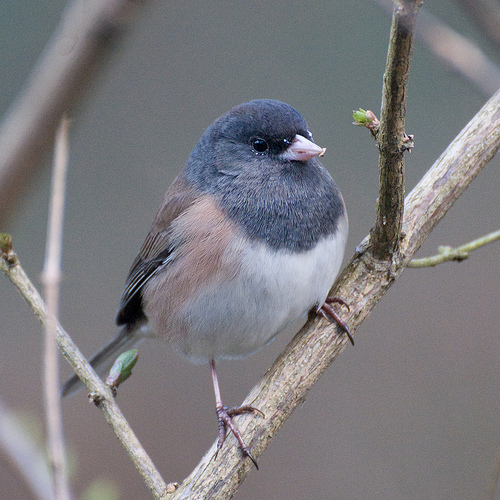

original


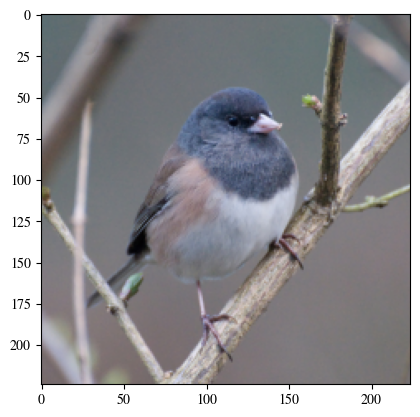

selected masks


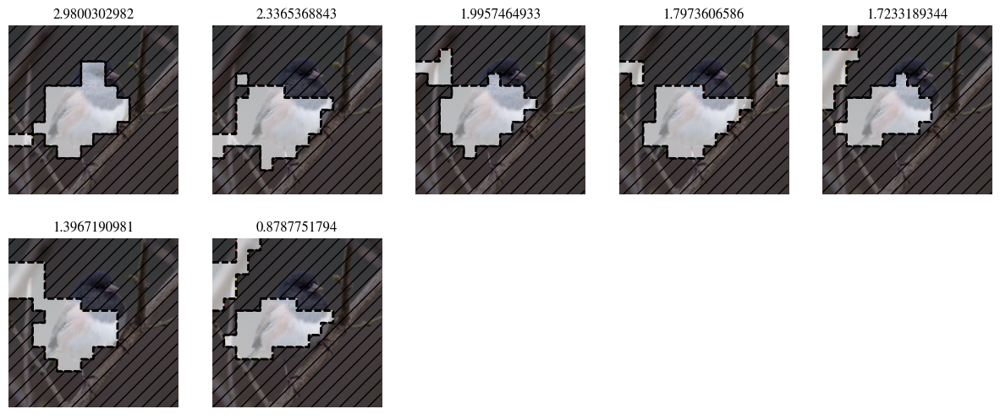

all masks


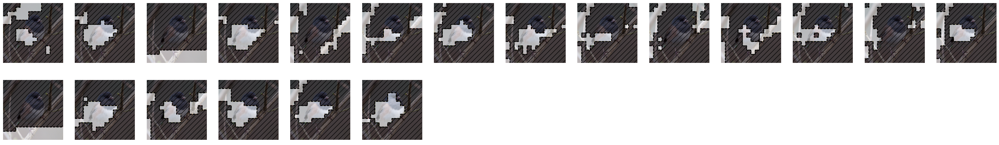

In [2]:
from PIL import Image

# Open an example image
# image_path = '../../examples/ILSVRC2012_val_00000873.JPEG'
image_path = '../../examples/ILSVRC2012_val_00000247.JPEG'
image = Image.open(image_path)
image.show()
image_rgb = image.convert("RGB")
inputs = torch.tensor(processor(image_rgb)['pixel_values'])
inputs.shape

# Get the outputs from the model
outputs = model(inputs.to(device), return_tuple=True)

from exlib.modules.sop import show_masks_weights

show_masks_weights(inputs, outputs, i=0)

## Train

Training SOP is the same as training any model. You can simply plug SOP into your original training pipeline by replaceing the original model with the SOP model.

In [3]:
import sys
sys.path.append('/shared_data0/weiqiuy/sop/src')

from sop.tasks.images.imagenet.data import get_dataset

train_dataset, train_dataloader = get_dataset('imagenet', split='train', shuffle=True, processor=processor)
val_dataset, val_dataloader = get_dataset('imagenet', split='val', num_data=1, shuffle=False, processor=processor)
train_val_dataset, train_val_dataloader = get_dataset('imagenet', split='train_val', num_data=1, shuffle=False, processor=processor)

Loaded 1281166 images and 1000 classes
Loaded 1000 images and 1000 classes
Loaded 1000 images and 1000 classes


### Simple training loop

Here is a showcase of a simple training loop. I did not include saving and evaluating for simplicity.

In [4]:
import torch.nn as nn
from torch.optim import SGD, AdamW
from tqdm.auto import tqdm

# training args
batch_size = 16
lr = 0.000005
num_epochs = 20
warmup_steps = 2000
mask_batch_size = 64

from torch.optim import SGD, AdamW

lr = 5e-6
criterion = nn.CrossEntropyLoss()
optimizer = AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)

In [6]:
# Fast version
import logging
import math
import json

# Iterate over the data
best_val_acc = 0.0
step = 0
train_log_interval = 100
val_eval_interval = 400

num_epochs = 1
num_training_steps = len(train_dataloader) * num_epochs
train_rep_step_size = int(num_training_steps / config.num_heads)

progress_bar = tqdm(range(num_training_steps))
model.train()

# iterate over the epochs. Currently we just use one epoch.
for epoch in range(math.ceil(num_epochs)):
    running_loss = 0.0
    running_total = 0
    
    # iterate over the data
    for i, batch in enumerate(train_dataloader):
        inputs, labels = batch
        inputs, labels = inputs.to(device), labels.to(device)
        
        optimizer.zero_grad()
        train_rep_step = step // train_rep_step_size
        logits = model(inputs, epoch=train_rep_step, mask_batch_size=mask_batch_size)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * labels.size(0)
        running_total += labels.size(0)
        
        if i % train_log_interval == train_log_interval - 1 or i == len(train_dataloader) - 1:
            # Print training loss every 100 batches
            curr_lr = float(optimizer.param_groups[0]['lr'])
            log_message = f'Epoch {epoch}, Batch {i + 1}, Loss {running_loss / running_total:.4f}, LR {curr_lr:.8f}'
            
            running_loss = 0.0
            running_total = 0
          
        # lr_scheduler.step()
        progress_bar.update(1)
        
        step += 1
        if step > num_training_steps:
            break
    if step > num_training_steps:
        break    

  0%|          | 0/80073 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Complete Training Loop.

Here is the complete version of the training loop I use.

In [4]:
from exlib.modules.sop import show_masks_weights, get_masks_used

def evaluate(model, dataloader, criterion, sop=True, binary_threshold=-1, verbose=0):
    print('Eval ...')
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    total_nnz = 0
    total_num_masks = 0
    total_coverage = 0
    total_nnz_all = 0
    correct_max = 0
    correct_num = 0

    with torch.no_grad():
        progress_bar_eval = tqdm(range(len(dataloader)))
        for bi, batch in enumerate(dataloader):
            if bi % 10 != 0:
                progress_bar_eval.update(1)
                continue
            # Now you can use `inputs` and `labels` in your training loop.
            inputs, labels = batch
            inputs, labels = inputs.to(device), labels.to(device)

            if sop:
                outputs = model(inputs, return_tuple=True, binary_threshold=binary_threshold)

                if verbose > 0:
                    if bi in [10, 20, 30]:
                        show_masks_weights(inputs, outputs)

                logits = outputs.logits

                for i in range(len(logits)):
                    pred = logits[i].argmax(-1).item()

                    outputs_processed = get_masks_used(outputs, i=i)
                    masks = outputs_processed['masks_sort_used']
                    mask_weights = outputs_processed['mask_weights_sort_used']

                    # pred_mask_idxs_sort = outputs.mask_weights[i,:,pred].argsort(descending=True)
                    nnz = (masks[mask_weights != 0] > 0).sum() / masks[mask_weights != 0].view(-1).shape[0]
                    total_nnz += nnz.item()
                    total_num_masks += len(masks)
                    
                    nnz_all = (outputs.masks != 0).sum() / outputs.masks.view(-1).shape[0]
                    total_nnz_all += nnz_all.item()
                    
                    coverage = masks.bool().sum(-3).bool().sum() / (masks.shape[-1] * masks.shape[-2])
                    total_coverage += coverage.item()
                
                # import pdb; pdb.set_trace()
                preds_max = outputs.logits_all.argmax(-1) # (bsz, num_masks)
                correct_max += (preds_max == labels[:,None]).sum(-1).bool().sum().item()
                correct_num += (preds_max == labels[:,None]).sum(-1).sum().item()
            else:
                outputs = model(inputs)
                if isinstance(outputs, torch.Tensor):
                    logits = outputs
                else:
                    logits = outputs.logits
            
            # val loss
            loss = criterion(logits, labels)
            total_loss += loss.item()
            
            # acc
            _, predicted = torch.max(logits.data, 1)
            correct += (predicted == labels).sum().item()
            # print('predicted', predicted, 'labels', labels)
            
            total += labels.size(0)
            
            progress_bar_eval.update(1)
            # if bi > 100:
            #     break
    
    val_acc = correct / total
    val_loss = total_loss / total
    val_nnz = total_nnz / total
    val_nnz_all = total_nnz_all / total
    val_n_masks_avg = total_num_masks / total
    val_coverage = total_coverage / total
    val_max_acc = correct_max / total
    val_perc_correct = correct_num / total
    
    model.train()
    
    return {
        'val_acc': val_acc,
        'val_loss': val_loss,
        'val_nnz': val_nnz,
        'val_nnz_all': val_nnz_all,
        'val_n_masks_avg': val_n_masks_avg,
        'val_coverage': val_coverage,
        'total': total,
        'val_max_acc': val_max_acc,
        'val_perc_correct': val_perc_correct
    }

In [5]:
import torch.nn as nn
from torch.optim import SGD, AdamW
from tqdm.auto import tqdm

# training args
batch_size = 16
lr = 0.000005
num_epochs = 20
warmup_steps = 2000
mask_batch_size = 64

from torch.optim import SGD, AdamW

lr = 5e-6
criterion = nn.CrossEntropyLoss()
optimizer = AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=lr)

backbone_val_results = evaluate(original_model, val_dataloader, criterion, sop=False)
backbone_val_acc = backbone_val_results['val_acc']
print('Backbone val acc: ', backbone_val_acc)

Eval ...


  0%|          | 0/63 [00:00<?, ?it/s]

Backbone val acc:  0.7678571428571429


In [6]:
val_results = evaluate(model, val_dataloader, criterion, sop=True)
val_acc = val_results['val_acc']
val_nnz_all = val_results['val_nnz_all']
val_max_acc = val_results['val_max_acc']
val_perc_correct = val_results['val_perc_correct']
val_coverage = val_results['val_coverage']
val_n_masks_avg = val_results['val_n_masks_avg']
print('Untrained sop val acc: ', val_acc, 'val_max_acc', val_max_acc, 'val_perc_correct', val_perc_correct, 'val_nnz_all', val_nnz_all, 'val_n_masks_avg', val_n_masks_avg)


Eval ...


  0%|          | 0/63 [00:00<?, ?it/s]

Untrained sop val acc:  0.4642857142857143 val_max_acc 0.6964285714285714 val_perc_correct 4.9375 val_nnz_all 0.19897958636283875 val_n_masks_avg 7.946428571428571


In [9]:
train_val_results = evaluate(model, train_val_dataloader, criterion, sop=True)
train_val_acc = train_val_results['val_acc']
train_val_nnz_all = train_val_results['val_nnz_all']
train_val_max_acc = train_val_results['val_max_acc']
train_val_perc_correct = train_val_results['val_perc_correct']
train_val_coverage = train_val_results['val_coverage']
train_val_n_masks_avg = train_val_results['val_n_masks_avg']
print('Untrained sop train_val acc: ', train_val_acc, 'train_val_max_acc', train_val_max_acc, 'train_val_perc_correct', train_val_perc_correct, 'train_val_nnz_all', train_val_nnz_all, 'train_val_n_masks_avg', train_val_n_masks_avg)


Eval ...


  0%|          | 0/63 [00:00<?, ?it/s]

Untrained sop train_val acc:  0.5 train_val_max_acc 0.6607142857142857 train_val_perc_correct 4.848214285714286 train_val_nnz_all 0.19897958636283875 train_val_n_masks_avg 7.0625


  0%|          | 0/80073 [00:00<?, ?it/s]

Eval ...


  0%|          | 0/63 [00:00<?, ?it/s]

original


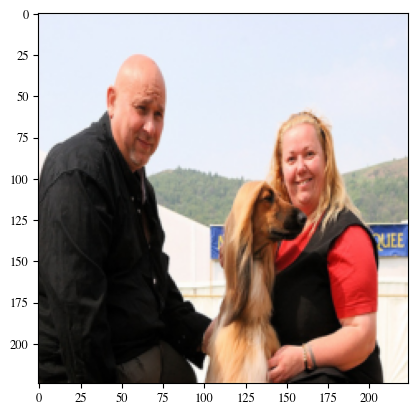

selected masks


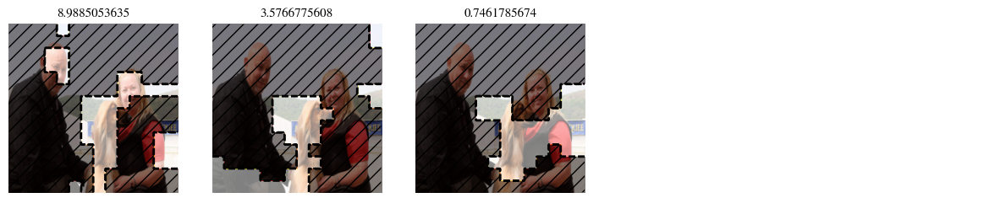

all masks


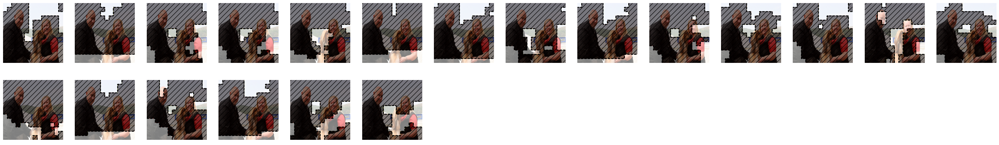

original


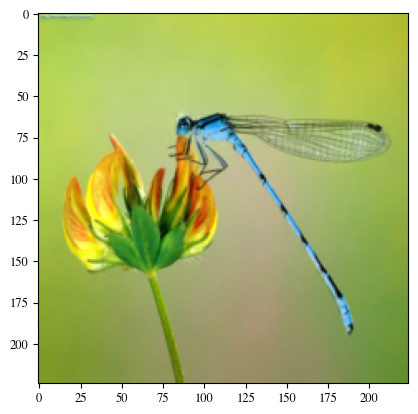

selected masks


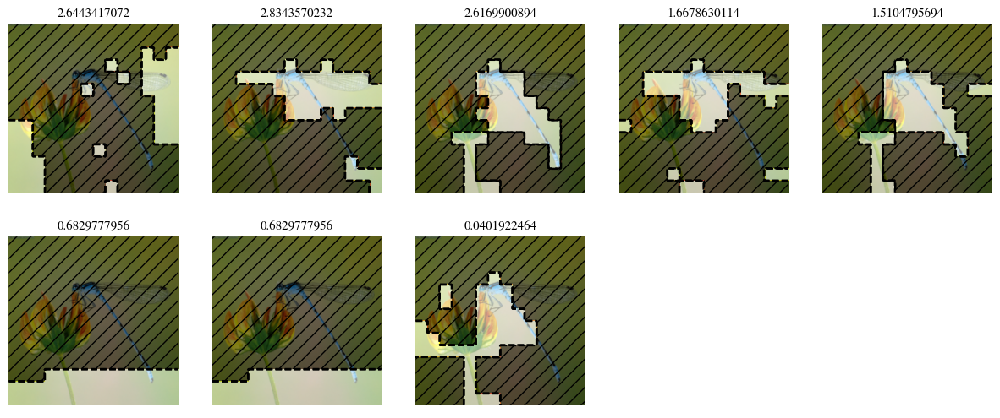

all masks


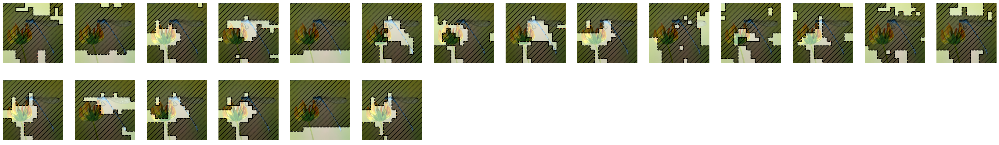

original


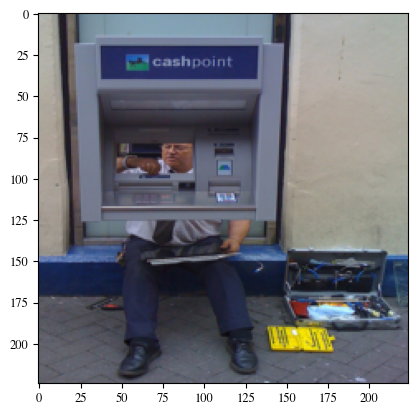

selected masks


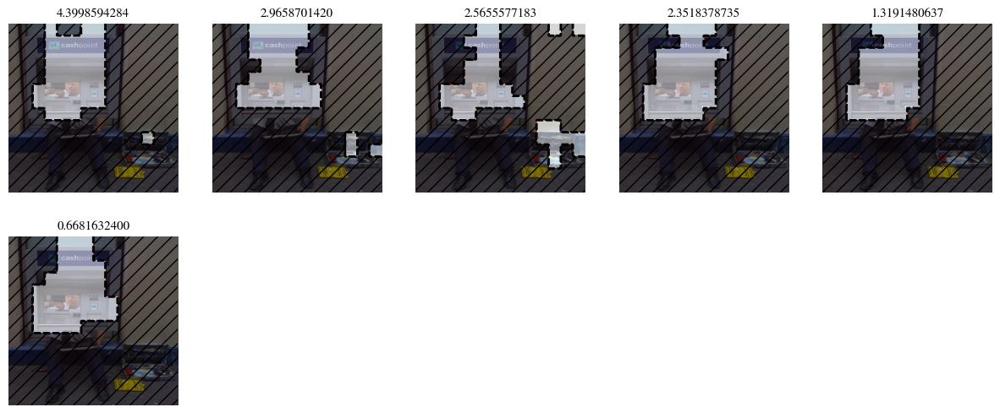

all masks


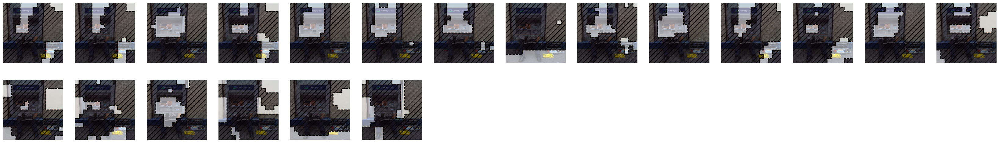

Epoch 0, Step 0, Train Val acc 0.4911, Train Val loss 0.1571
new best train_val acc: 0.49107142857142855
Best checkpoint saved at ../exps/imagenet_exp/best/checkpoint.pth
Last checkpoint saved at ../exps/imagenet_exp/last/checkpoint.pth


KeyboardInterrupt: 

In [14]:
import logging
import math
import json

# track = True
track = False

exp_dir = f'../exps/imagenet_exp'
os.makedirs(exp_dir, exist_ok=True)

# checkpoint dirs
last_dir = os.path.join(exp_dir, 'last')
best_dir = os.path.join(exp_dir, 'best')
best_checkpoint_path = os.path.join(best_dir, 'checkpoint.pth')
last_checkpoint_path = os.path.join(last_dir, 'checkpoint.pth')
config_best_checkpoint_path = os.path.join(best_dir, 'config.json')
config_last_checkpoint_path = os.path.join(last_dir, 'config.json')
result_best_checkpoint_path = os.path.join(best_dir, 'result.json')
result_last_checkpoint_path = os.path.join(last_dir, 'result.json')
hf_best_path = os.path.join(best_dir, 'hf_model')
hf_last_path = os.path.join(last_dir, 'hf_model')


if track:
    import wandb
    wandb.init(project='sop')
    wandb.run.name = os.path.basename(exp_dir)
    wandb.log({'backbone_val_acc': backbone_val_acc,
              'val_acc': val_acc,
              'train_val_acc': train_val_acc,
              'step': 0})

# Iterate over the data
best_val_acc = 0.0
step = 0
train_log_interval = 100
val_eval_interval = 400

logging.basicConfig(filename=os.path.join(exp_dir, 'train.log'), level=logging.INFO)

num_epochs = 1
num_training_steps = len(train_dataloader) * num_epochs
train_rep_step_size = int(num_training_steps / config.num_heads)

progress_bar = tqdm(range(num_training_steps))
model.train()
for epoch in range(math.ceil(num_epochs)):
    running_loss = 0.0
    running_total = 0
    for i, batch in enumerate(train_dataloader):
        inputs, labels = batch
        inputs, labels = inputs.to(device), labels.to(device)
        
        optimizer.zero_grad()
        train_rep_step = step // train_rep_step_size
        logits = model(inputs, epoch=train_rep_step, mask_batch_size=mask_batch_size)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * labels.size(0)
        running_total += labels.size(0)
        
        if i % train_log_interval == train_log_interval - 1 or i == len(train_dataloader) - 1:
            # Print training loss every 100 batches
            curr_lr = float(optimizer.param_groups[0]['lr'])
            log_message = f'Epoch {epoch}, Batch {i + 1}, Loss {running_loss / running_total:.4f}, LR {curr_lr:.8f}'
            print(log_message)
            logging.info(log_message)
            if track:
                wandb.log({'train_loss': running_loss / running_total,
                        'lr': curr_lr,
                        'epoch': epoch,
                        'step': step})
            running_loss = 0.0
            running_total = 0
            
        # if i % val_eval_interval == val_eval_interval - 1 or i == len(train_dataloader) - 1:
        if step == 0 or i % val_eval_interval == min(100, val_eval_interval - 1) or i == len(train_dataloader) - 1:
            if (i // val_eval_interval) % 10 == 0:
                verbose = 1
            else:
                verbose = 0
            train_val_results = evaluate(model, train_val_dataloader, criterion, binary_threshold=0.5, verbose=verbose)
            train_val_acc = train_val_results['val_acc']
            train_val_loss = train_val_results['val_loss']
            train_val_nnz = train_val_results['val_nnz']
            train_val_nnz_all = train_val_results['val_nnz_all']
            train_val_n_masks_avg = train_val_results['val_n_masks_avg']
            train_val_max_acc = train_val_results['val_max_acc']
            train_val_perc_correct = train_val_results['val_perc_correct']
            train_val_coverage = train_val_results['val_coverage']
            
            log_message = f'Epoch {epoch}, Step {step}, Train Val acc {train_val_acc:.4f}, Train Val loss {train_val_loss:.4f}'
            print(log_message)
            logging.info(log_message)
            result = {
                           'train_val_acc': train_val_acc,
                           'train_val_loss': train_val_loss,
                            'train_val_nnz': train_val_nnz,
                            'train_val_nnz_all': train_val_nnz_all,
                            'train_val_n_masks_avg': train_val_n_masks_avg,
                           'train_val_max_acc': train_val_max_acc,
                           'train_val_perc_correct': train_val_perc_correct,
                           'train_val_coverage': train_val_coverage,
                            'group_gen_scale': model.group_gen_scale,
                            'group_sel_scale': model.group_sel_scale,
                            'epoch': epoch,
                            'step': step}
            if track:
                wandb.log(result)
            
            
            checkpoint = {
                    'model': model.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    # 'lr_scheduler': lr_scheduler.state_dict(),
                    'epoch': epoch,
                    'step': step,
                    'train_val_loss': train_val_loss,
                    'train_val_acc': train_val_acc,
                }
            if train_val_acc > best_val_acc:
                best_val_acc = train_val_acc
                print('new best train_val acc:', best_val_acc)
                os.makedirs(best_dir, exist_ok=True)
                torch.save(checkpoint, best_checkpoint_path)
                config.save_to_json(config_best_checkpoint_path)
                with open(result_best_checkpoint_path, 'wt') as output_file:
                    json.dump(result, output_file)
                model.save_pretrained(hf_best_path)
                print(f'Best checkpoint saved at {best_checkpoint_path}')
                
            os.makedirs(last_dir, exist_ok=True)
            torch.save(checkpoint, last_checkpoint_path)
            config.save_to_json(config_last_checkpoint_path)
            with open(result_last_checkpoint_path, 'wt') as output_file:
                json.dump(result, output_file)
            model.save_pretrained(hf_last_path)
            print(f'Last checkpoint saved at {last_checkpoint_path}')
            
        # lr_scheduler.step()
        progress_bar.update(1)
        
        step += 1
        if step > num_training_steps:
            break
    if step > num_training_steps:
        break    